# CSE457 – Xử lý âm thanh và tiếng nói
## LAB 1 – Phân tích và xử lý tín hiệu âm thanh số
Các phần chính:

- **A** – Đọc và kiểm tra dữ liệu âm thanh
- **B** – Phân tích miền thời gian
- **C** – FFT và phổ tần số
- **D** – STFT và spectrogram
- **E** – So sánh Rectangular và Hamming
- **F** – FIR Low-pass / High-pass
- **G** – Quantization, resampling và coding

In [1]:
# 0. Kiểm tra và tự động cài các thư viện cần thiết

import sys
import subprocess
import importlib.util

REQUIRED_PACKAGES = {
    "numpy": "numpy",
    "pandas": "pandas",
    "matplotlib": "matplotlib",
    "scipy": "scipy",
    "soundfile": "soundfile",
    "IPython": "IPython",
}

missing = [
    pip_name
    for pip_name, module_name in REQUIRED_PACKAGES.items()
    if importlib.util.find_spec(module_name) is None
]

if missing:
    print("Đang cài các thư viện còn thiếu:", ", ".join(missing))
    subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
else:
    print("Tất cả thư viện cần thiết đã được cài đặt.")

Tất cả thư viện cần thiết đã được cài đặt.


In [2]:
# 1. Import thư viện và tạo thư mục đầu ra

from pathlib import Path
import math
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import soundfile as sf

from scipy import signal
from IPython.display import Audio, display

%matplotlib inline

plt.rcParams["figure.figsize"] = (14, 5)
plt.rcParams["axes.grid"] = True

FIGURE_DIR = Path("figures")
OUTPUT_AUDIO_DIR = Path("output_audio")

FIGURE_DIR.mkdir(exist_ok=True)
OUTPUT_AUDIO_DIR.mkdir(exist_ok=True)

print("Import thư viện thành công.")
print("Thư mục làm việc:", Path.cwd())

Import thư viện thành công.
Thư mục làm việc: c:\Users\vuhoa\OneDrive\Máy tính\Year4\Speech\lab_1


# A. Đọc và kiểm tra dữ liệu âm thanh

Yêu cầu thực hiện:

1. Đọc file âm thanh và kiểm tra `Fs`, số kênh, thời lượng, bit depth và kích thước file.
2. Nếu tín hiệu là stereo, chuyển về mono bằng trung bình hai kênh.
3. Chuẩn hóa dữ liệu về miền `[-1, 1]`.
4. So sánh RMS giữa tín hiệu stereo và mono.

In [3]:
# A1. Khai báo đường dẫn file âm thanh

AUDIO_PATH = Path("audio/phong_vien_nu_truc_tiep_trong_bao.wav")

if not AUDIO_PATH.exists():
    raise FileNotFoundError(
        f"Không tìm thấy file: {AUDIO_PATH.resolve()}\n"
        "Hãy kiểm tra thư mục audio và tên file âm thanh."
    )

print("Đã tìm thấy file:", AUDIO_PATH.resolve())

Đã tìm thấy file: C:\Users\vuhoa\OneDrive\Máy tính\Year4\Speech\lab_1\audio\phong_vien_nu_truc_tiep_trong_bao.wav


In [4]:
# A2. Đọc metadata và tín hiệu

info = sf.info(str(AUDIO_PATH))
x, Fs = sf.read(str(AUDIO_PATH), dtype="float64", always_2d=True)

num_samples = x.shape[0]
channels = x.shape[1]
duration = num_samples / Fs
file_size_bytes = AUDIO_PATH.stat().st_size
file_size_mb = file_size_bytes / (1024**2)

bit_depth_map = {
    "PCM_S8": 8,
    "PCM_U8": 8,
    "PCM_16": 16,
    "PCM_24": 24,
    "PCM_32": 32,
    "FLOAT": 32,
    "DOUBLE": 64,
}

bit_depth = bit_depth_map.get(info.subtype, None)

metadata = pd.DataFrame({
    "Thuộc tính": [
        "Tên file",
        "Sampling rate",
        "Số kênh",
        "Thời lượng",
        "Số mẫu / kênh",
        "Định dạng",
        "Subtype",
        "Bit depth",
        "Kích thước file",
    ],
    "Giá trị": [
        AUDIO_PATH.name,
        f"{Fs} Hz",
        channels,
        f"{duration:.3f} s",
        num_samples,
        info.format,
        info.subtype,
        f"{bit_depth} bit/mẫu" if bit_depth is not None else "Không xác định",
        f"{file_size_mb:.3f} MB",
    ]
})

metadata

,Thuộc tính,Giá trị
0,Tên file,phong_vien_nu_truc_tiep_trong_bao.wav
1,Sampling rate,44100 Hz
2,Số kênh,2
3,Thời lượng,38.869 s
4,Số mẫu / kênh,1714136
5,Định dạng,WAV
6,Subtype,PCM_16
7,Bit depth,16 bit/mẫu
8,Kích thước file,6.539 MB


In [5]:
# A3. Chuẩn hóa dữ liệu về [-1, 1] và stereo -> mono

x_normalized = x.copy()

max_abs = np.max(np.abs(x_normalized))
if max_abs > 1.0:
    x_normalized = x_normalized / max_abs

x_normalized = np.clip(x_normalized, -1.0, 1.0)

if channels > 1:
    x_mono = np.mean(x_normalized, axis=1)
else:
    x_mono = x_normalized[:, 0]

def rms(sig):
    sig = np.asarray(sig, dtype=np.float64)
    return np.sqrt(np.mean(sig**2))

rows = []
for ch in range(channels):
    label = f"Kênh {ch + 1}"
    if channels == 2:
        label = "Kênh trái (L)" if ch == 0 else "Kênh phải (R)"
    rows.append([label, rms(x_normalized[:, ch])])

rows.append(["Mono", rms(x_mono)])

print(f"Miền biên độ: [{x_normalized.min():.6f}, {x_normalized.max():.6f}]")
pd.DataFrame(rows, columns=["Tín hiệu", "RMS"])

Miền biên độ: [-0.960022, 0.841187]


,Tín hiệu,RMS
0,Kênh trái (L),0.157063
1,Kênh phải (R),0.157001
2,Mono,0.147110


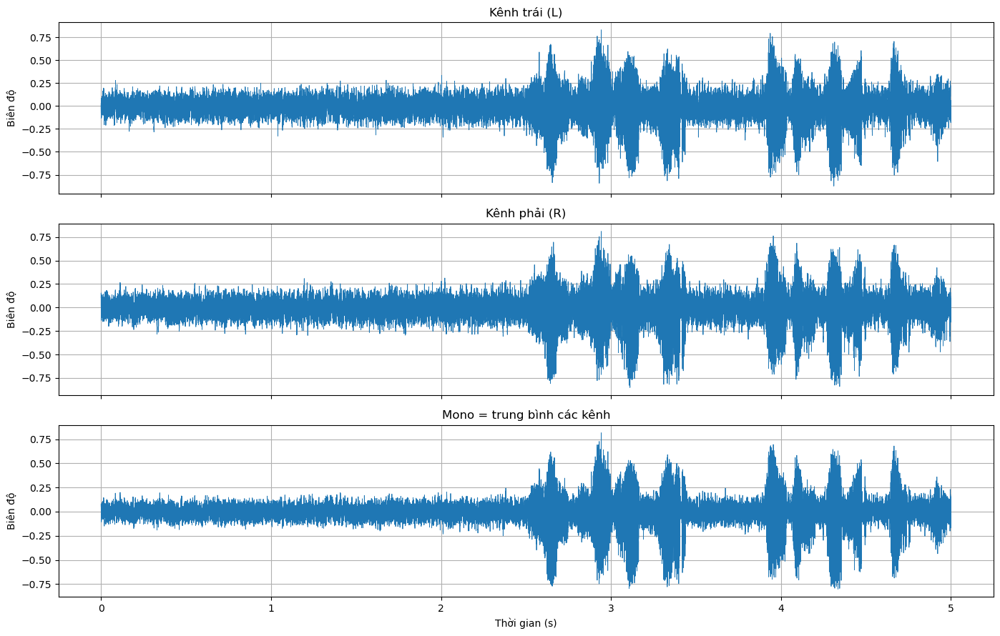

In [6]:
# A4. So sánh waveform stereo và mono trong 5 giây đầu

view_duration = min(5.0, duration)
N_view = int(view_duration * Fs)
t_view = np.arange(N_view) / Fs

if channels >= 2:
    fig, axes = plt.subplots(3, 1, figsize=(14, 9), sharex=True)

    axes[0].plot(t_view, x_normalized[:N_view, 0], linewidth=0.6)
    axes[0].set_title("Kênh trái (L)")
    axes[0].set_ylabel("Biên độ")

    axes[1].plot(t_view, x_normalized[:N_view, 1], linewidth=0.6)
    axes[1].set_title("Kênh phải (R)")
    axes[1].set_ylabel("Biên độ")

    axes[2].plot(t_view, x_mono[:N_view], linewidth=0.6)
    axes[2].set_title("Mono = trung bình các kênh")
    axes[2].set_xlabel("Thời gian (s)")
    axes[2].set_ylabel("Biên độ")

    plt.tight_layout()
else:
    plt.plot(t_view, x_mono[:N_view], linewidth=0.6)
    plt.title("Waveform mono")
    plt.xlabel("Thời gian (s)")
    plt.ylabel("Biên độ")
    plt.tight_layout()

plt.savefig(FIGURE_DIR / "A_stereo_mono.png", dpi=250, bbox_inches="tight")
plt.show()

In [7]:
# A5. Lưu bản mono chuẩn hóa

MONO_PATH = OUTPUT_AUDIO_DIR / "mono_normalized.wav"
sf.write(str(MONO_PATH), x_mono, Fs, subtype="PCM_16")

print("Đã lưu:", MONO_PATH.resolve())

Đã lưu: C:\Users\vuhoa\OneDrive\Máy tính\Year4\Speech\lab_1\output_audio\mono_normalized.wav


# B. Phân tích miền thời gian

Các đại lượng sử dụng:

\[
Peak = \max_n |x[n]|
\]

\[
RMS = \sqrt{\frac{1}{N}\sum_{n=0}^{N-1}x^2[n]}
\]

\[
E = \sum_{n=0}^{N-1}x^2[n]
\]

Phần này vẽ waveform toàn tệp và một đoạn 1 giây, sau đó kiểm tra Peak, RMS, Energy và clipping.

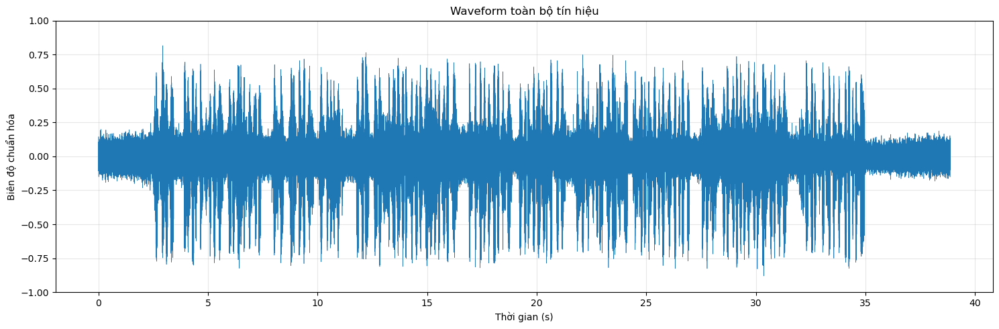

In [8]:
# B1. Waveform toàn bộ file

time = np.arange(len(x_mono)) / Fs

plt.figure(figsize=(15, 5))
plt.plot(time, x_mono, linewidth=0.45)
plt.title("Waveform toàn bộ tín hiệu")
plt.xlabel("Thời gian (s)")
plt.ylabel("Biên độ chuẩn hóa")
plt.ylim(-1, 1)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(FIGURE_DIR / "B_waveform_full.png", dpi=250, bbox_inches="tight")
plt.show()

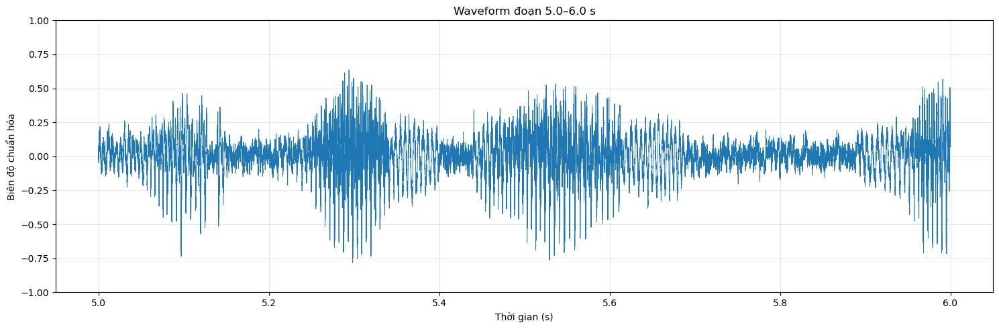

In [9]:
# B2. Waveform một đoạn 1 giây

B_START = 5.0
B_END = 6.0

i0 = int(B_START * Fs)
i1 = int(B_END * Fs)

segment_B = x_mono[i0:i1]
t_B = np.arange(len(segment_B)) / Fs + B_START

plt.figure(figsize=(15, 5))
plt.plot(t_B, segment_B, linewidth=0.65)
plt.title(f"Waveform đoạn {B_START:.1f}–{B_END:.1f} s")
plt.xlabel("Thời gian (s)")
plt.ylabel("Biên độ chuẩn hóa")
plt.ylim(-1, 1)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(FIGURE_DIR / "B_waveform_5_6s.png", dpi=250, bbox_inches="tight")
plt.show()

In [10]:
# B3. Peak, RMS, Energy và clipping

def time_metrics(sig, clipping_threshold=0.999):
    sig = np.asarray(sig, dtype=np.float64)
    peak = np.max(np.abs(sig))
    rms_value = np.sqrt(np.mean(sig**2))
    energy = np.sum(sig**2)
    clipping_samples = np.sum(np.abs(sig) >= clipping_threshold)
    clipping_percent = 100 * clipping_samples / len(sig)
    return peak, rms_value, energy, clipping_samples, clipping_percent

peak, rms_value, energy, clip_n, clip_pct = time_metrics(x_mono)

eps = 1e-12
peak_dbfs = 20 * np.log10(max(peak, eps))
rms_dbfs = 20 * np.log10(max(rms_value, eps))

B_metrics = pd.DataFrame({
    "Đại lượng": [
        "Peak",
        "RMS",
        "Energy",
        "Peak level",
        "RMS level",
        "Near-clipping samples",
        "Near-clipping percentage",
    ],
    "Giá trị": [
        f"{peak:.6f}",
        f"{rms_value:.6f}",
        f"{energy:.2f}",
        f"{peak_dbfs:.2f} dBFS",
        f"{rms_dbfs:.2f} dBFS",
        clip_n,
        f"{clip_pct:.6f}%",
    ]
})

B_metrics

,Đại lượng,Giá trị
0,Peak,0.880356
1,RMS,0.147110
2,Energy,37096.42
3,Peak level,-1.11 dBFS
4,RMS level,-16.65 dBFS
5,Near-clipping samples,0
6,Near-clipping percentage,0.000000%


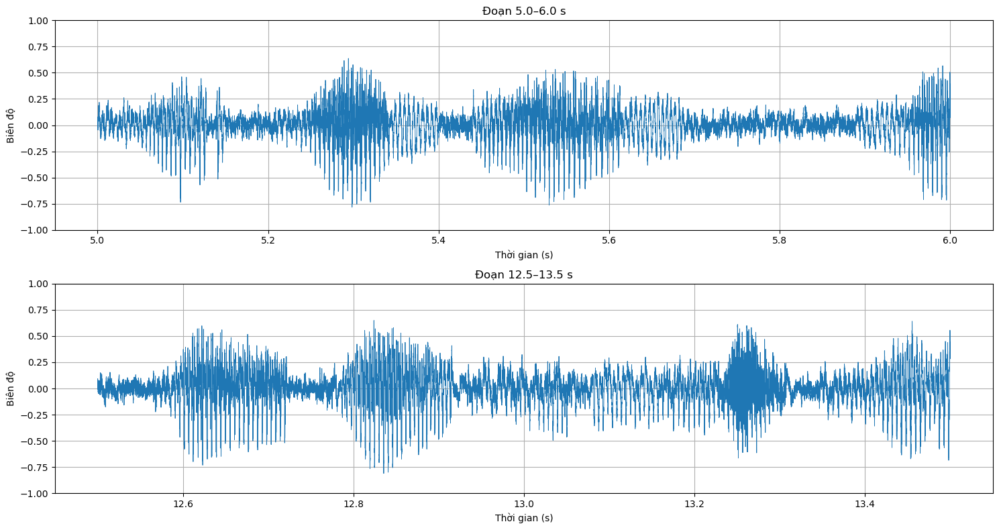

,Đoạn,Peak,RMS,Energy,Clipping (%)
0,5.0–6.0 s,0.783951,0.150963,1005.031309,0.0
1,12.5–13.5 s,0.811035,0.172880,1318.043978,0.0


In [11]:
# B4. So sánh hai đoạn có đặc tính khác nhau

segments_B = {
    "5.0–6.0 s": (5.0, 6.0),
    "12.5–13.5 s": (12.5, 13.5),
}

comparison = []

fig, axes = plt.subplots(2, 1, figsize=(15, 8))

for ax, (label, (start, end)) in zip(axes, segments_B.items()):
    s = x_mono[int(start*Fs):int(end*Fs)]
    ts = np.arange(len(s)) / Fs + start

    ax.plot(ts, s, linewidth=0.65)
    ax.set_title(f"Đoạn {label}")
    ax.set_xlabel("Thời gian (s)")
    ax.set_ylabel("Biên độ")
    ax.set_ylim(-1, 1)

    p, r, e, cn, cp = time_metrics(s)
    comparison.append([label, p, r, e, cp])

plt.tight_layout()
plt.savefig(FIGURE_DIR / "B_two_segments.png", dpi=250, bbox_inches="tight")
plt.show()

pd.DataFrame(
    comparison,
    columns=["Đoạn", "Peak", "RMS", "Energy", "Clipping (%)"]
)

### Nhận xét phần B

- Waveform thay đổi liên tục theo thời gian vì bản ghi đồng thời chứa **giọng phóng viên, gió, mưa và các biến cố nền**.
- Peak nhỏ hơn full-scale và tỷ lệ mẫu gần clipping cho biết mức độ an toàn biên độ của tín hiệu.
- Hai đoạn có cùng thời lượng 1 giây nên có thể so sánh trực tiếp RMS và Energy; đoạn có RMS/Energy lớn hơn chứa mức năng lượng âm thanh mạnh hơn.

# C. Phân tích miền tần số bằng FFT

Yêu cầu:

- Chọn một đoạn tương đối ổn định dài 0.5–1.0 s.
- Nhân cửa sổ Hamming.
- Tính FFT và vẽ phổ tuyến tính / dB.
- Tìm ít nhất 3 đỉnh phổ.
- So sánh ít nhất 2 giá trị `NFFT`.

Trong thí nghiệm này dùng đoạn **5.0–5.8 s** và so sánh `NFFT = 65536` với `131072`.

In [12]:
# C1. Chuẩn bị đoạn tín hiệu và hàm tính phổ FFT

C_START = 5.0
C_END = 5.8

x_C = x_mono[int(C_START*Fs):int(C_END*Fs)]
window_C = np.hamming(len(x_C))

NFFT_VALUES = [65536, 131072]

def fft_spectrum(sig, fs, nfft, window=None):
    sig = np.asarray(sig, dtype=np.float64)

    if window is None:
        window = np.ones(len(sig))

    X = np.fft.rfft(sig * window, n=nfft)
    f = np.fft.rfftfreq(nfft, d=1/fs)

    # Chuẩn hóa theo tổng cửa sổ để phổ dễ so sánh hơn
    mag = np.abs(X) / max(np.sum(window), 1e-12)
    mag_db = 20 * np.log10(np.maximum(mag, 1e-12))

    return f, mag, mag_db

fft_results = {}

for nfft in NFFT_VALUES:
    f, mag, mag_db = fft_spectrum(x_C, Fs, nfft, window_C)
    fft_results[nfft] = (f, mag, mag_db)

    print(
        f"NFFT = {nfft:6d} | "
        f"Δf = {Fs/nfft:.4f} Hz/bin | "
        f"độ dài frame = {len(x_C)/Fs:.3f} s"
    )

NFFT =  65536 | Δf = 0.6729 Hz/bin | độ dài frame = 0.800 s
NFFT = 131072 | Δf = 0.3365 Hz/bin | độ dài frame = 0.800 s


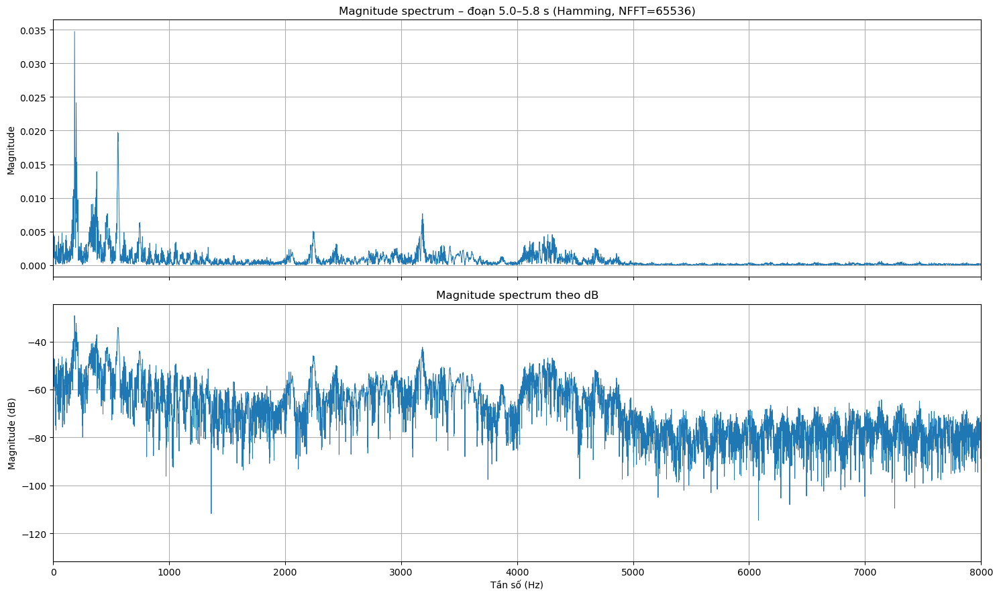

In [13]:
# C2. Vẽ magnitude spectrum tuyến tính và dB

NFFT_MAIN = NFFT_VALUES[0]
f_C, mag_C, mag_db_C = fft_results[NFFT_MAIN]

fig, axes = plt.subplots(2, 1, figsize=(15, 9), sharex=True)

axes[0].plot(f_C, mag_C, linewidth=0.7)
axes[0].set_title(
    f"Magnitude spectrum – đoạn {C_START:.1f}–{C_END:.1f} s "
    f"(Hamming, NFFT={NFFT_MAIN})"
)
axes[0].set_ylabel("Magnitude")
axes[0].set_xlim(0, 8000)

axes[1].plot(f_C, mag_db_C, linewidth=0.7)
axes[1].set_title("Magnitude spectrum theo dB")
axes[1].set_xlabel("Tần số (Hz)")
axes[1].set_ylabel("Magnitude (dB)")
axes[1].set_xlim(0, 8000)

plt.tight_layout()
plt.savefig(FIGURE_DIR / "C_fft_linear_db.png", dpi=250, bbox_inches="tight")
plt.show()

In [14]:
# C3. Tìm các đỉnh phổ nổi bật

# Chỉ tìm peak trong 50–8000 Hz để bỏ DC và vùng ngoài phạm vi quan sát chính.
search_mask = (f_C >= 50) & (f_C <= 8000)

# Chuyển về dB tương đối so với peak lớn nhất trong đoạn
mag_rel_db = 20 * np.log10(
    np.maximum(mag_C / np.max(mag_C), 1e-12)
)

df_main = Fs / NFFT_MAIN
min_peak_distance_hz = 30
distance_bins = max(1, int(min_peak_distance_hz / df_main))

local_peaks, properties = signal.find_peaks(
    mag_rel_db[search_mask],
    prominence=6,
    distance=distance_bins
)

global_indices = np.where(search_mask)[0][local_peaks]

# Chọn 6 peak có biên độ lớn nhất
if len(global_indices) > 0:
    order = np.argsort(mag_rel_db[global_indices])[::-1]
    top_indices = global_indices[order[:6]]
else:
    top_indices = np.array([], dtype=int)

peak_table = pd.DataFrame({
    "Tần số (Hz)": f_C[top_indices],
    "Mức tương đối (dB)": mag_rel_db[top_indices],
}).sort_values("Mức tương đối (dB)", ascending=False)

peak_table

,Tần số (Hz),Mức tương đối (dB)
0,185.050964,0.000000
1,557.171631,-4.900730
2,376.158142,-7.954776
3,341.839600,-11.642482
4,3184.222412,-13.118398
5,467.674255,-13.129150


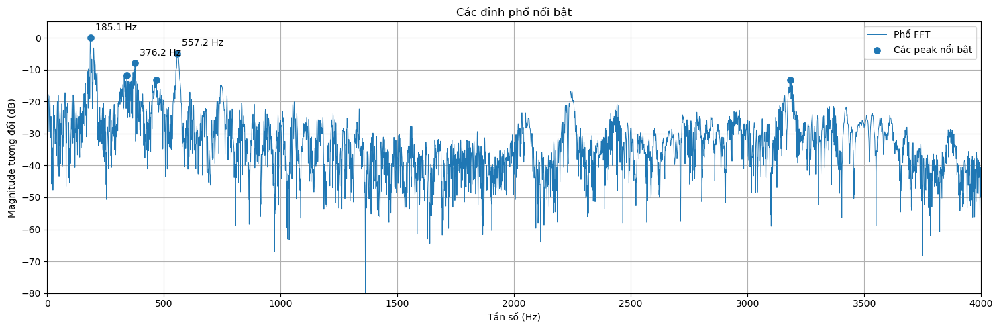

In [15]:
# C4. Minh họa các peak trên phổ

plt.figure(figsize=(15, 5))
plt.plot(f_C, mag_rel_db, linewidth=0.7, label="Phổ FFT")

if len(top_indices) > 0:
    plt.scatter(
        f_C[top_indices],
        mag_rel_db[top_indices],
        s=45,
        label="Các peak nổi bật"
    )

    for idx in top_indices[:3]:
        plt.annotate(
            f"{f_C[idx]:.1f} Hz",
            (f_C[idx], mag_rel_db[idx]),
            xytext=(5, 8),
            textcoords="offset points"
        )

plt.xlim(0, 4000)
plt.ylim(-80, 5)
plt.xlabel("Tần số (Hz)")
plt.ylabel("Magnitude tương đối (dB)")
plt.title("Các đỉnh phổ nổi bật")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURE_DIR / "C_fft_peaks.png", dpi=250, bbox_inches="tight")
plt.show()

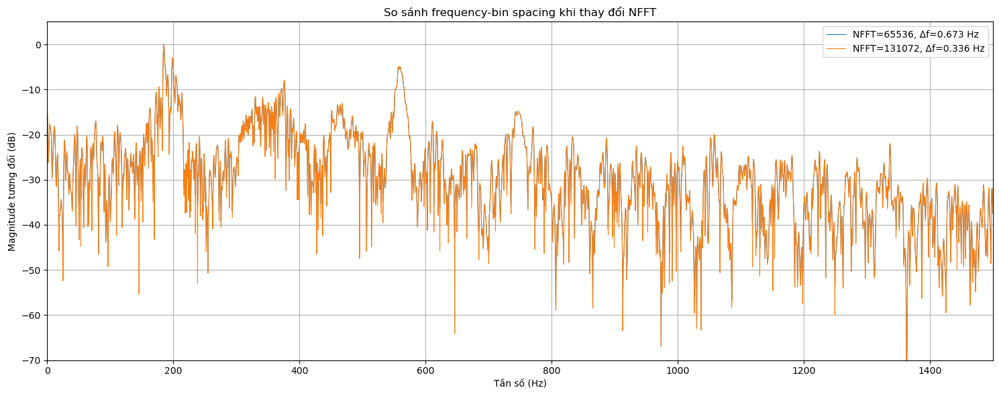

In [16]:
# C5. So sánh hai giá trị NFFT

plt.figure(figsize=(15, 6))

for nfft in NFFT_VALUES:
    f, mag, _ = fft_results[nfft]
    rel_db = 20 * np.log10(np.maximum(mag / np.max(mag), 1e-12))

    plt.plot(
        f,
        rel_db,
        linewidth=0.8,
        label=f"NFFT={nfft}, Δf={Fs/nfft:.3f} Hz"
    )

plt.xlim(0, 1500)
plt.ylim(-70, 5)
plt.xlabel("Tần số (Hz)")
plt.ylabel("Magnitude tương đối (dB)")
plt.title("So sánh frequency-bin spacing khi thay đổi NFFT")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURE_DIR / "C_compare_nfft.png", dpi=250, bbox_inches="tight")
plt.show()

### Nhận xét phần C

- Khi tăng `NFFT`, khoảng cách giữa các frequency bin giảm theo \(\Delta f=F_s/NFFT\), do đó đường phổ được lấy mẫu dày hơn.
- Tuy nhiên, vì đoạn tín hiệu và độ dài cửa sổ vẫn giữ nguyên, **true frequency resolution không tự động tăng tương ứng với zero-padding**.
- Các peak được đánh dấu cho thấy một số thành phần tần số nổi bật của giọng nói và nền môi trường trong đoạn đã chọn.

# D. STFT và Spectrogram

Cấu hình chuẩn:

- frame ≈ **25 ms**
- hop ≈ **10 ms**
- cửa sổ Hamming

Sau đó so sánh frame length **10 / 25 / 50 ms** trong một controlled experiment:

- cùng tín hiệu;
- cùng hop 10 ms;
- cùng `NFFT = 4096`;
- cùng Hamming;
- cùng thang màu.

In [17]:
# D1. Hàm STFT và spectrogram

def compute_stft_db(sig, fs, frame_ms, hop_ms=10, nfft=4096):
    L = round(frame_ms / 1000 * fs)
    H = round(hop_ms / 1000 * fs)

    if H > L:
        raise ValueError("Hop size không được lớn hơn frame length trong cấu hình này.")

    f, t, Z = signal.stft(
        sig,
        fs=fs,
        window="hamming",
        nperseg=L,
        noverlap=L-H,
        nfft=nfft,
        boundary=None,
        padded=False
    )

    S = np.abs(Z)
    S_db = 20 * np.log10(np.maximum(S, 1e-12))

    return f, t, S_db, L, H

# Chọn cùng một đoạn 20 giây để các phép so sánh D được kiểm soát và hình dễ quan sát.
D_START = 2.0
D_END = min(22.0, duration)

x_D = x_mono[int(D_START*Fs):int(D_END*Fs)]

f25, t25_local, S25_db, L25, H25 = compute_stft_db(
    x_D, Fs, frame_ms=25, hop_ms=10, nfft=4096
)

t25 = t25_local + D_START

print(f"Đoạn phân tích: {D_START:.1f}–{D_END:.1f} s")
print(f"Frame 25 ms: L = {L25} mẫu")
print(f"Hop 10 ms  : H = {H25} mẫu")
print(f"Overlap    : {L25-H25} mẫu ({100*(L25-H25)/L25:.1f}%)")

Đoạn phân tích: 2.0–22.0 s
Frame 25 ms: L = 1102 mẫu
Hop 10 ms  : H = 441 mẫu
Overlap    : 661 mẫu (60.0%)


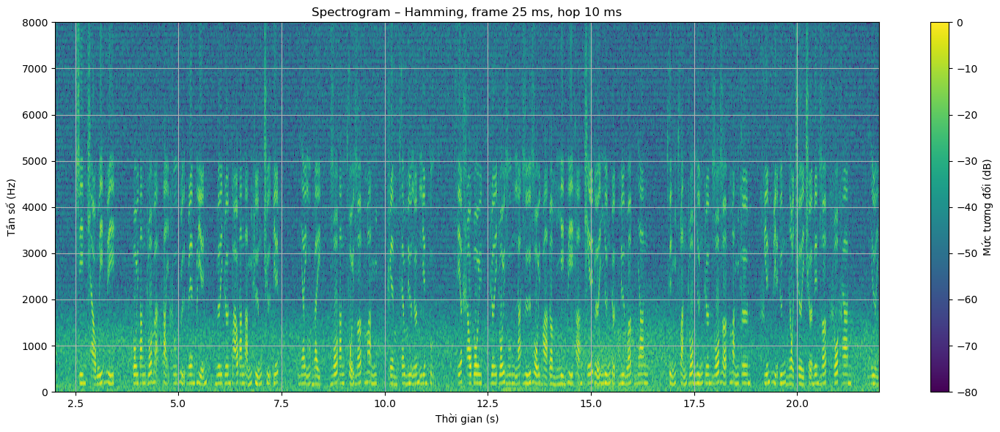

In [18]:
# D2. Spectrogram chuẩn 25 ms / 10 ms

S25_rel = S25_db - np.max(S25_db)

# Chỉ vẽ đến 8 kHz để tập trung vào vùng quan trọng của tiếng nói và giảm kích thước hình.
freq_mask_25 = f25 <= 8000

plt.figure(figsize=(15, 6))
plt.pcolormesh(
    t25,
    f25[freq_mask_25],
    S25_rel[freq_mask_25, :],
    shading="auto",
    vmin=-80,
    vmax=0
)
plt.ylim(0, 8000)
plt.xlabel("Thời gian (s)")
plt.ylabel("Tần số (Hz)")
plt.title("Spectrogram – Hamming, frame 25 ms, hop 10 ms")
plt.colorbar(label="Mức tương đối (dB)")
plt.tight_layout()
plt.savefig(FIGURE_DIR / "D_spectrogram_25ms.png", dpi=200, bbox_inches="tight")
plt.show()

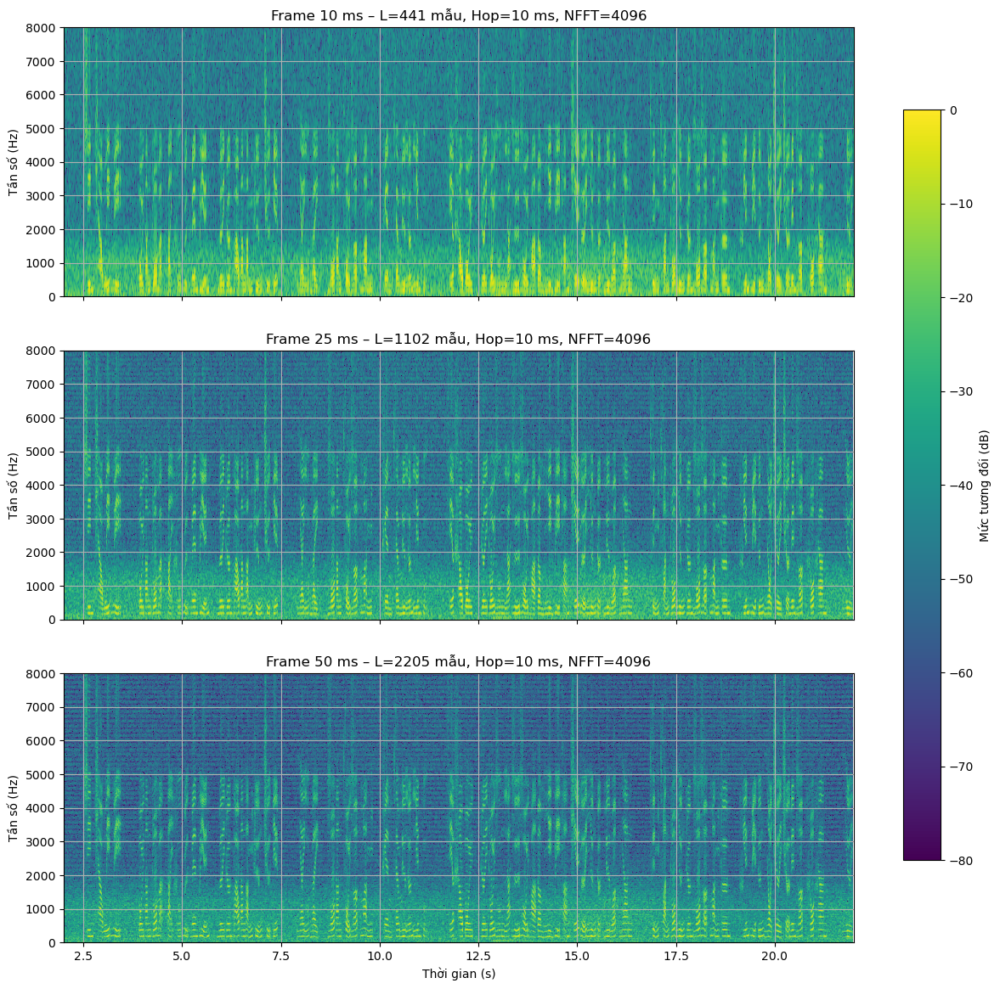

In [19]:
# D3. So sánh frame length 10 / 25 / 50 ms

FRAME_LENGTHS_MS = [10, 25, 50]
D_results = {}

for frame_ms in FRAME_LENGTHS_MS:
    fD, tD_local, SD_db, LD, HD = compute_stft_db(
        x_D,
        Fs,
        frame_ms=frame_ms,
        hop_ms=10,
        nfft=4096
    )

    D_results[frame_ms] = (
        fD,
        tD_local + D_START,
        SD_db,
        LD,
        HD
    )

# Cùng một mốc peak và dynamic range cho cả ba hình.
global_max = max(np.max(v[2]) for v in D_results.values())

fig, axes = plt.subplots(3, 1, figsize=(15, 14), sharex=True)

for ax, frame_ms in zip(axes, FRAME_LENGTHS_MS):
    fD, tD, SD_db, LD, HD = D_results[frame_ms]

    freq_mask = fD <= 8000
    SD_rel = SD_db - global_max

    pcm = ax.pcolormesh(
        tD,
        fD[freq_mask],
        SD_rel[freq_mask, :],
        shading="auto",
        vmin=-80,
        vmax=0
    )

    ax.set_ylim(0, 8000)
    ax.set_ylabel("Tần số (Hz)")
    ax.set_title(
        f"Frame {frame_ms} ms – L={LD} mẫu, Hop=10 ms, NFFT=4096"
    )

axes[-1].set_xlabel("Thời gian (s)")
fig.colorbar(pcm, ax=axes, label="Mức tương đối (dB)", shrink=0.82)
plt.savefig(FIGURE_DIR / "D_compare_frame_lengths.png", dpi=200, bbox_inches="tight")
plt.show()

### Nhận xét phần D

- **Frame 10 ms:** định vị biến đổi nhanh theo thời gian tốt hơn nhưng các cấu trúc tần số rộng và khó tách hơn.
- **Frame 25 ms:** tạo sự cân bằng giữa độ phân giải thời gian và tần số, phù hợp với phân tích tiếng nói.
- **Frame 50 ms:** các dải tần trở nên sắc hơn nhưng các transient/biến đổi nhanh theo thời gian bị làm mờ.
- Vì cùng đoạn dữ liệu, `NFFT = 4096`, hop 10 ms, Hamming và cùng thang màu, khác biệt quan sát được chủ yếu đến từ **frame length**.

# E. Thí nghiệm cửa sổ: Rectangular vs Hamming

Để so sánh công bằng:

- cùng một frame;
- cùng `NFFT`;
- chỉ thay loại cửa sổ.

Ta lấy frame 25 ms bắt đầu tại khoảng **5.30 s**.

In [20]:
# E1. Chuẩn bị cùng một frame cho hai cửa sổ

E_START = 5.30
E_FRAME_MS = 25
E_L = round(E_FRAME_MS / 1000 * Fs)
E_I0 = int(E_START * Fs)

x_E = x_mono[E_I0:E_I0 + E_L]

win_rect = np.ones(E_L)
win_hamming = np.hamming(E_L)

E_NFFT = 4096

def windowed_spectrum_db(sig, window, fs, nfft):
    X = np.fft.rfft(sig * window, n=nfft)
    f = np.fft.rfftfreq(nfft, d=1/fs)

    # Bù coherent gain để hai cửa sổ có thể so sánh hợp lý hơn
    mag = np.abs(X) / max(np.sum(window), 1e-12)
    return f, 20 * np.log10(np.maximum(mag, 1e-12))

f_rect, db_rect = windowed_spectrum_db(x_E, win_rect, Fs, E_NFFT)
f_ham, db_ham = windowed_spectrum_db(x_E, win_hamming, Fs, E_NFFT)

common_peak = max(np.max(db_rect), np.max(db_ham))
rect_rel = db_rect - common_peak
ham_rel = db_ham - common_peak

print("Frame length:", E_L, "mẫu")
print("NFFT:", E_NFFT)
print("Δf:", Fs / E_NFFT, "Hz/bin")

Frame length: 1102 mẫu
NFFT: 4096
Δf: 10.7666015625 Hz/bin


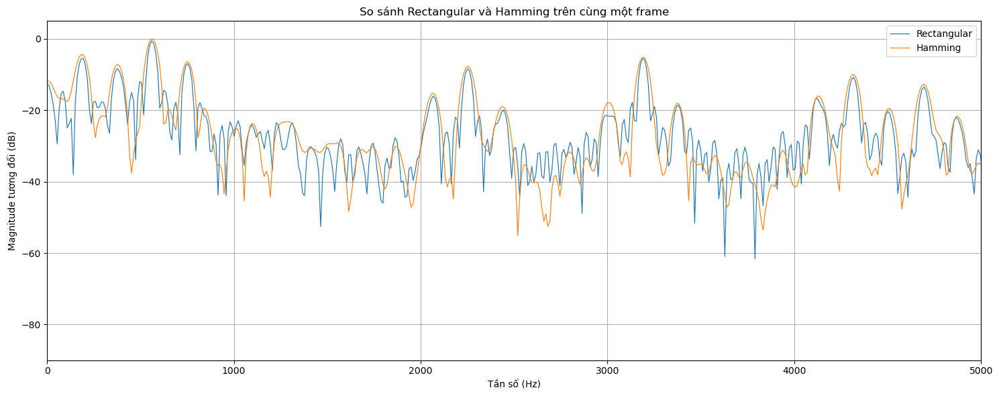

In [21]:
# E2. So sánh log-spectrum

plt.figure(figsize=(15, 6))
plt.plot(f_rect, rect_rel, linewidth=0.85, label="Rectangular")
plt.plot(f_ham, ham_rel, linewidth=0.85, label="Hamming")

plt.xlim(0, 5000)
plt.ylim(-90, 5)
plt.xlabel("Tần số (Hz)")
plt.ylabel("Magnitude tương đối (dB)")
plt.title("So sánh Rectangular và Hamming trên cùng một frame")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURE_DIR / "E_rectangular_vs_hamming.png", dpi=250, bbox_inches="tight")
plt.show()

### Nhận xét phần E

- Rectangular có **main lobe hẹp hơn** nhưng side-lobe cao hơn, vì vậy năng lượng từ một thành phần tần số dễ rò sang các bin lân cận hơn.
- Hamming làm giảm side-lobe và **spectral leakage**, nhưng đổi lại main lobe rộng hơn.
- Vì main lobe của Hamming rộng hơn, hai thành phần tần số nằm rất gần nhau có thể khó phân tách hơn.

# F. Lọc số FIR

Thiết kế:

1. **Low-pass FIR:** cutoff = 2500 Hz
2. **High-pass FIR:** cutoff = 1000 Hz
3. `numtaps = 201`
4. Hamming window

Với FIR đối xứng dài 201 taps, group delay xấp xỉ:

\[
\frac{201-1}{2}=100 \text{ mẫu}
\]

In [22]:
# F1. Thiết kế FIR Low-pass và High-pass

NUMTAPS = 201
LPF_CUTOFF = 2500
HPF_CUTOFF = 1000

b_lpf = signal.firwin(
    numtaps=NUMTAPS,
    cutoff=LPF_CUTOFF,
    fs=Fs,
    window="hamming",
    pass_zero="lowpass"
)

b_hpf = signal.firwin(
    numtaps=NUMTAPS,
    cutoff=HPF_CUTOFF,
    fs=Fs,
    window="hamming",
    pass_zero="highpass"
)

group_delay_samples = (NUMTAPS - 1) // 2
group_delay_ms = group_delay_samples / Fs * 1000

print(f"Group delay ≈ {group_delay_samples} mẫu = {group_delay_ms:.3f} ms")
print("10 hệ số đầu LPF:", b_lpf[:10])
print("10 hệ số đầu HPF:", b_hpf[:10])

Group delay ≈ 100 mẫu = 2.268 ms
10 hệ số đầu LPF: [-2.22219654e-04 -1.67132602e-04 -8.98386782e-05  1.91697880e-06
  9.84938717e-05  1.89065394e-04  2.62527464e-04  3.08585790e-04
  3.18960640e-04  2.88600843e-04]
10 hệ số đầu HPF: [-0.00025316 -0.00025788 -0.00025887 -0.00025587 -0.00024859 -0.00023663
 -0.00021959 -0.000197   -0.00016845 -0.00013355]


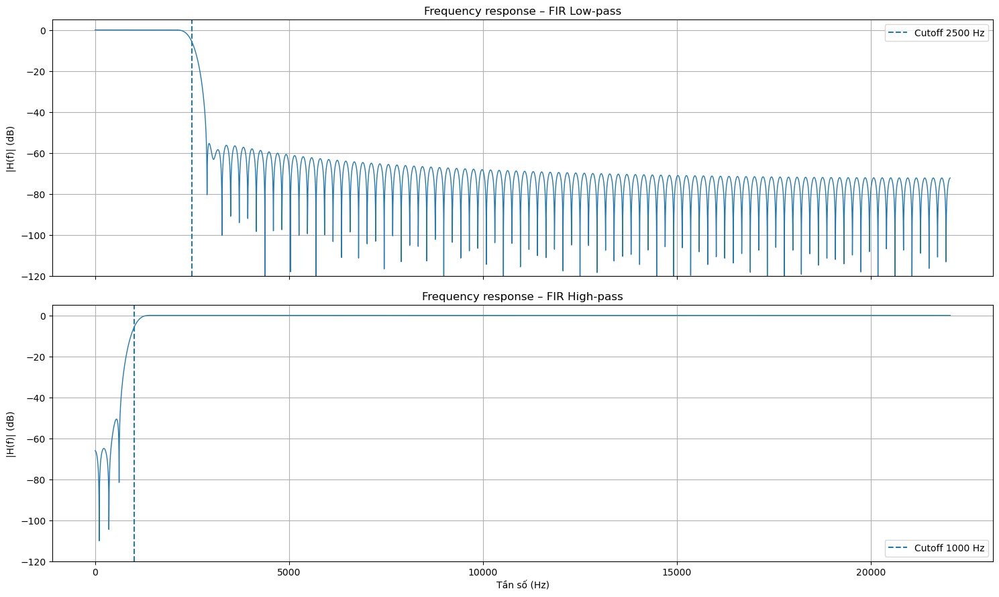

In [23]:
# F2. Frequency response H(f)

w_lpf, H_lpf = signal.freqz(b_lpf, worN=8192, fs=Fs)
w_hpf, H_hpf = signal.freqz(b_hpf, worN=8192, fs=Fs)

H_lpf_db = 20 * np.log10(np.maximum(np.abs(H_lpf), 1e-12))
H_hpf_db = 20 * np.log10(np.maximum(np.abs(H_hpf), 1e-12))

fig, axes = plt.subplots(2, 1, figsize=(15, 9), sharex=True)

axes[0].plot(w_lpf, H_lpf_db, linewidth=1.0)
axes[0].axvline(LPF_CUTOFF, linestyle="--", label=f"Cutoff {LPF_CUTOFF} Hz")
axes[0].set_title("Frequency response – FIR Low-pass")
axes[0].set_ylabel("|H(f)| (dB)")
axes[0].set_ylim(-120, 5)
axes[0].legend()

axes[1].plot(w_hpf, H_hpf_db, linewidth=1.0)
axes[1].axvline(HPF_CUTOFF, linestyle="--", label=f"Cutoff {HPF_CUTOFF} Hz")
axes[1].set_title("Frequency response – FIR High-pass")
axes[1].set_xlabel("Tần số (Hz)")
axes[1].set_ylabel("|H(f)| (dB)")
axes[1].set_ylim(-120, 5)
axes[1].legend()

plt.tight_layout()
plt.savefig(FIGURE_DIR / "F_filter_response.png", dpi=250, bbox_inches="tight")
plt.show()

In [24]:
# F3. Áp dụng bộ lọc và xuất WAV

y_lpf = signal.lfilter(b_lpf, [1.0], x_mono)
y_hpf = signal.lfilter(b_hpf, [1.0], x_mono)

LPF_PATH = OUTPUT_AUDIO_DIR / "filtered_lpf_2500Hz.wav"
HPF_PATH = OUTPUT_AUDIO_DIR / "filtered_hpf_1000Hz.wav"

sf.write(str(LPF_PATH), np.clip(y_lpf, -1, 1), Fs, subtype="PCM_16")
sf.write(str(HPF_PATH), np.clip(y_hpf, -1, 1), Fs, subtype="PCM_16")

print("Đã lưu:", LPF_PATH)
print("Đã lưu:", HPF_PATH)

Đã lưu: output_audio\filtered_lpf_2500Hz.wav
Đã lưu: output_audio\filtered_hpf_1000Hz.wav


In [25]:
# F4. Nghe thử 8 giây đầu

listen_seconds = min(8, int(duration))
N_listen = int(listen_seconds * Fs)

print("Tín hiệu gốc (mono):")
display(Audio(x_mono[:N_listen], rate=Fs))

print("Low-pass 2500 Hz:")
display(Audio(y_lpf[:N_listen], rate=Fs))

print("High-pass 1000 Hz:")
display(Audio(y_hpf[:N_listen], rate=Fs))

Tín hiệu gốc (mono):


Low-pass 2500 Hz:


High-pass 1000 Hz:


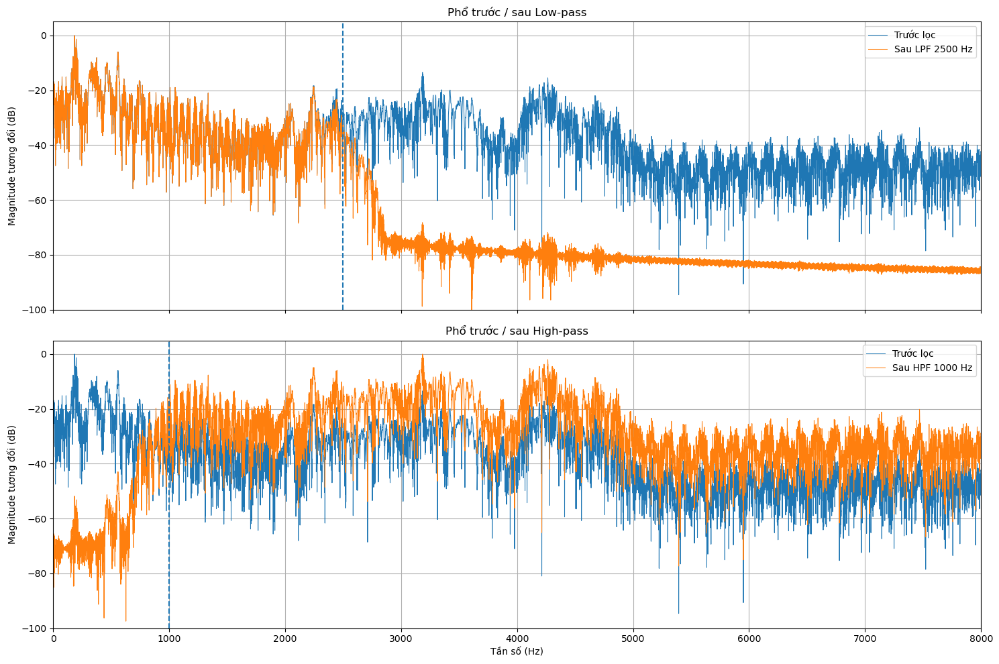

In [26]:
# F5. So sánh phổ trước / sau lọc trên cùng đoạn 5–6 s

# Bù group delay để so sánh cùng nội dung thời gian
def compensate_fir_delay(y, delay):
    if delay <= 0:
        return y.copy()
    y_aligned = np.empty_like(y)
    y_aligned[:-delay] = y[delay:]
    y_aligned[-delay:] = 0
    return y_aligned

y_lpf_aligned = compensate_fir_delay(y_lpf, group_delay_samples)
y_hpf_aligned = compensate_fir_delay(y_hpf, group_delay_samples)

F_START = 5.0
F_END = 6.0
F_I0 = int(F_START * Fs)
F_I1 = int(F_END * Fs)

original_F = x_mono[F_I0:F_I1]
lpf_F = y_lpf_aligned[F_I0:F_I1]
hpf_F = y_hpf_aligned[F_I0:F_I1]

F_NFFT = 65536
F_window = np.hamming(len(original_F))

def relative_fft_db(sig):
    X = np.fft.rfft(sig * F_window, n=F_NFFT)
    f = np.fft.rfftfreq(F_NFFT, d=1/Fs)
    mag = np.abs(X)
    return f, 20*np.log10(np.maximum(mag / np.max(mag), 1e-12))

f0, db0 = relative_fft_db(original_F)
_, db_lpf = relative_fft_db(lpf_F)
_, db_hpf = relative_fft_db(hpf_F)

fig, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

axes[0].plot(f0, db0, linewidth=0.75, label="Trước lọc")
axes[0].plot(f0, db_lpf, linewidth=0.75, label="Sau LPF 2500 Hz")
axes[0].axvline(LPF_CUTOFF, linestyle="--")
axes[0].set_title("Phổ trước / sau Low-pass")
axes[0].set_ylabel("Magnitude tương đối (dB)")
axes[0].set_ylim(-100, 5)
axes[0].legend()

axes[1].plot(f0, db0, linewidth=0.75, label="Trước lọc")
axes[1].plot(f0, db_hpf, linewidth=0.75, label="Sau HPF 1000 Hz")
axes[1].axvline(HPF_CUTOFF, linestyle="--")
axes[1].set_title("Phổ trước / sau High-pass")
axes[1].set_xlabel("Tần số (Hz)")
axes[1].set_ylabel("Magnitude tương đối (dB)")
axes[1].set_ylim(-100, 5)
axes[1].legend()

plt.xlim(0, 8000)
plt.tight_layout()
plt.savefig(FIGURE_DIR / "F_spectrum_before_after.png", dpi=250, bbox_inches="tight")
plt.show()

### Nhận xét phần F

- Low-pass 2500 Hz giữ phần lớn năng lượng thấp và làm suy giảm mạnh vùng cao hơn cutoff; âm thanh thường trở nên tối/muffled hơn.
- High-pass 1000 Hz làm giảm các thành phần tần số thấp, bao gồm nhiều năng lượng gió/rumble, trong khi giữ lại phần cao của giọng và tiếng mưa.
- Đồ thị phổ trước/sau phải phù hợp với hình dạng của \(H(f)\).
- FIR 201 taps có group delay khoảng vài mili giây; khi so sánh các đoạn tín hiệu, notebook đã bù delay để tránh so sánh lệch thời gian.

# G. Lượng tử hóa, resampling và mã hóa

Thực hiện:

1. Quantization ở **4 / 8 / 16 bit** và tính SNR.
2. Resample về **16 kHz / 8 kHz** bằng `resample_poly` có lọc chống aliasing.
3. So sánh phổ sau resampling.
4. Tính PCM bit rate, file size và compression ratio.

In [27]:
# G1. Quantization 4 / 8 / 16 bit

def quantize_symmetric(sig, B):
    qmax = 2**(B - 1) - 1
    sig_clip = np.clip(sig, -1.0, 1.0)
    return np.round(sig_clip * qmax) / qmax

def snr_db(reference, processed):
    reference = np.asarray(reference, dtype=np.float64)
    processed = np.asarray(processed, dtype=np.float64)

    error = processed - reference

    signal_power = np.sum(reference**2)
    noise_power = np.sum(error**2)

    if noise_power == 0:
        return np.inf

    return 10 * np.log10(signal_power / noise_power)

BIT_DEPTHS = [4, 8, 16]

quantized_signals = {}
quant_results = []

for B in BIT_DEPTHS:
    xq = quantize_symmetric(x_mono, B)
    quantized_signals[B] = xq

    snr_value = snr_db(x_mono, xq)

    quant_results.append({
        "B (bit/mẫu)": B,
        "Số mức": 2**B,
        "SNR đo được (dB)": snr_value,
    })

    # WAV thông thường không có PCM 4-bit/8-bit signed trực tiếp theo đúng dạng
    # của phép lượng tử này, nên lưu các mức lượng tử trong container PCM16.
    out_path = OUTPUT_AUDIO_DIR / f"quantized_{B}bit_levels_PCM16.wav"
    sf.write(str(out_path), xq, Fs, subtype="PCM_16")

quant_df = pd.DataFrame(quant_results)
quant_df

,B (bit/mẫu),Số mức,SNR đo được (dB)
0,4,16,11.259208
1,8,256,36.221874
2,16,65536,83.800935


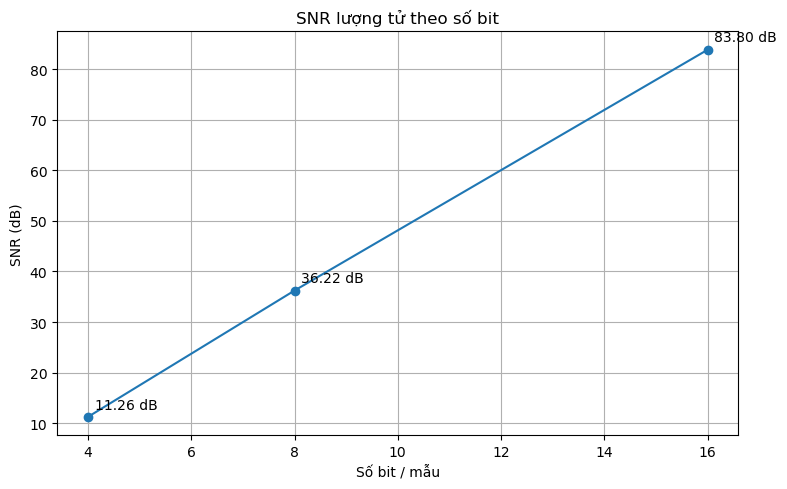

In [28]:
# G2. Vẽ SNR theo số bit

plt.figure(figsize=(8, 5))
plt.plot(
    quant_df["B (bit/mẫu)"],
    quant_df["SNR đo được (dB)"],
    marker="o"
)

for _, row in quant_df.iterrows():
    plt.annotate(
        f'{row["SNR đo được (dB)"]:.2f} dB',
        (row["B (bit/mẫu)"], row["SNR đo được (dB)"]),
        xytext=(5, 6),
        textcoords="offset points"
    )

plt.xlabel("Số bit / mẫu")
plt.ylabel("SNR (dB)")
plt.title("SNR lượng tử theo số bit")
plt.tight_layout()
plt.savefig(FIGURE_DIR / "G_quantization_snr.png", dpi=250, bbox_inches="tight")
plt.show()

In [29]:
# G3. Nghe thử 8 giây đầu của tín hiệu lượng tử

listen_seconds = min(8, int(duration))
N_listen = int(listen_seconds * Fs)

for B in BIT_DEPTHS:
    print(f"{B}-bit quantized levels:")
    display(Audio(quantized_signals[B][:N_listen], rate=Fs))

4-bit quantized levels:


8-bit quantized levels:


16-bit quantized levels:


In [30]:
# G4. Resampling về 16 kHz và 8 kHz

def resample_to(sig, fs_in, fs_out):
    g = math.gcd(fs_in, fs_out)

    up = fs_out // g
    down = fs_in // g

    # resample_poly sử dụng polyphase filtering và anti-alias filtering.
    y = signal.resample_poly(sig, up, down)

    return y

TARGET_SAMPLE_RATES = [16000, 8000]

resampled = {}

for target_fs in TARGET_SAMPLE_RATES:
    y = resample_to(x_mono, Fs, target_fs)
    resampled[target_fs] = y

    path = OUTPUT_AUDIO_DIR / f"resampled_{target_fs//1000}k.wav"
    sf.write(str(path), np.clip(y, -1, 1), target_fs, subtype="PCM_16")

    print(
        f"{Fs} Hz -> {target_fs} Hz | "
        f"{len(x_mono)} mẫu -> {len(y)} mẫu | "
        f"Nyquist mới = {target_fs/2:.0f} Hz"
    )

44100 Hz -> 16000 Hz | 1714136 mẫu -> 621909 mẫu | Nyquist mới = 8000 Hz
44100 Hz -> 8000 Hz | 1714136 mẫu -> 310955 mẫu | Nyquist mới = 4000 Hz


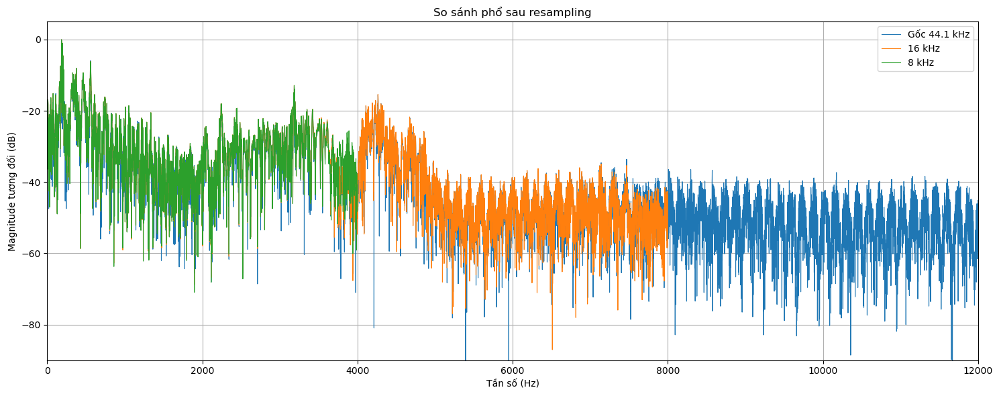

In [31]:
# G5. So sánh phổ gốc / 16 kHz / 8 kHz

G_START = 5.0
G_END = 6.0

def segment_spectrum_rel_db(sig, fs, start_s, end_s):
    s = sig[int(start_s*fs):int(end_s*fs)]
    w = np.hamming(len(s))

    # Chọn NFFT >= độ dài đoạn
    nfft = 1 << int(np.ceil(np.log2(max(len(s), 2))))

    X = np.fft.rfft(s*w, n=nfft)
    f = np.fft.rfftfreq(nfft, d=1/fs)
    mag = np.abs(X)
    rel_db = 20 * np.log10(np.maximum(mag / np.max(mag), 1e-12))

    return f, rel_db

plt.figure(figsize=(15, 6))

f_orig, db_orig = segment_spectrum_rel_db(x_mono, Fs, G_START, G_END)
plt.plot(f_orig, db_orig, linewidth=0.8, label=f"Gốc {Fs/1000:.1f} kHz")

for target_fs in TARGET_SAMPLE_RATES:
    f_r, db_r = segment_spectrum_rel_db(
        resampled[target_fs],
        target_fs,
        G_START,
        G_END
    )

    plt.plot(
        f_r,
        db_r,
        linewidth=0.8,
        label=f"{target_fs/1000:.0f} kHz"
    )

plt.xlim(0, 12000)
plt.ylim(-90, 5)
plt.xlabel("Tần số (Hz)")
plt.ylabel("Magnitude tương đối (dB)")
plt.title("So sánh phổ sau resampling")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURE_DIR / "G_resampling_spectrum.png", dpi=250, bbox_inches="tight")
plt.show()

In [32]:
# G6. Nghe thử 8 giây đầu của audio resampled

for target_fs in TARGET_SAMPLE_RATES:
    N_listen_resampled = min(len(resampled[target_fs]), int(8 * target_fs))

    print(f"Resampled {target_fs/1000:.0f} kHz:")
    display(Audio(resampled[target_fs][:N_listen_resampled], rate=target_fs))

Resampled 16 kHz:


Resampled 8 kHz:


In [33]:
# G7. PCM bitrate, theoretical file size và compressed coding

# Bit depth của input. Với file hiện tại là PCM_16.
PCM_BITS = bit_depth if bit_depth is not None else 16

pcm_bitrate_bps = Fs * PCM_BITS * channels
pcm_bitrate_kbps = pcm_bitrate_bps / 1000

pcm_size_bytes_theoretical = pcm_bitrate_bps * duration / 8

# Tạo một bản FLAC thực tế để có một định dạng nén có thể tái tạo
# mà không phụ thuộc FFmpeg bên ngoài.
FLAC_PATH = OUTPUT_AUDIO_DIR / "compressed_FLAC.flac"

sf.write(
    str(FLAC_PATH),
    x_normalized,
    Fs,
    format="FLAC",
    subtype="PCM_16"
)

flac_size_bytes = FLAC_PATH.stat().st_size
flac_effective_bitrate_kbps = flac_size_bytes * 8 / duration / 1000
flac_ratio = pcm_size_bytes_theoretical / flac_size_bytes
flac_saving = (1 - flac_size_bytes / pcm_size_bytes_theoretical) * 100

# So sánh thêm với MP3 128 kbps theo lý thuyết.
mp3_128_bitrate_kbps = 128
mp3_128_size_bytes_theoretical = (
    mp3_128_bitrate_kbps * 1000 * duration / 8
)
mp3_128_ratio = pcm_bitrate_kbps / mp3_128_bitrate_kbps

coding_df = pd.DataFrame([
    {
        "Định dạng": f"PCM {PCM_BITS}-bit, {channels} kênh",
        "Bit rate (kbps)": pcm_bitrate_kbps,
        "Kích thước": pcm_size_bytes_theoretical / (1024**2),
        "Compression ratio": 1.0,
        "Ghi chú": "Lý thuyết, chưa tính header"
    },
    {
        "Định dạng": "FLAC",
        "Bit rate (kbps)": flac_effective_bitrate_kbps,
        "Kích thước": flac_size_bytes / (1024**2),
        "Compression ratio": flac_ratio,
        "Ghi chú": f"Actual file, saving ≈ {flac_saving:.1f}%"
    },
    {
        "Định dạng": "MP3 128 kbps",
        "Bit rate (kbps)": mp3_128_bitrate_kbps,
        "Kích thước": mp3_128_size_bytes_theoretical / (1024**2),
        "Compression ratio": mp3_128_ratio,
        "Ghi chú": "Ước lượng lý thuyết"
    },
])

coding_df

,Định dạng,Bit rate (kbps),Kích thước,Compression ratio,Ghi chú
0,"PCM 16-bit, 2 kênh",1411.200000,6.538910,1.000000,"Lý thuyết, chưa tính header"
1,FLAC,1099.470977,5.094488,1.283526,"Actual file, saving ≈ 22.1%"
2,MP3 128 kbps,128.000000,0.593098,11.025000,Ước lượng lý thuyết


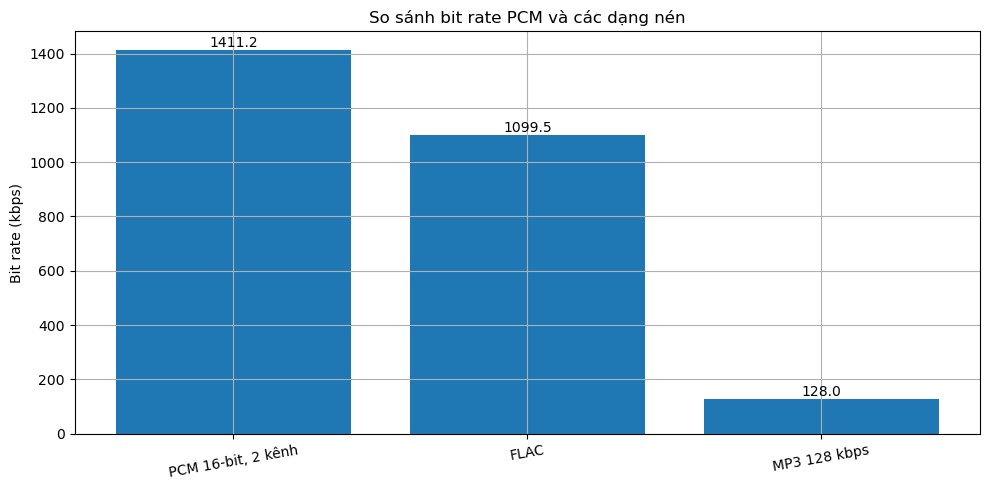

In [34]:
# G8. Vẽ so sánh bit rate

labels = coding_df["Định dạng"]
bitrates = coding_df["Bit rate (kbps)"]

plt.figure(figsize=(10, 5))
bars = plt.bar(labels, bitrates)

for bar, value in zip(bars, bitrates):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        f"{value:.1f}",
        ha="center",
        va="bottom"
    )

plt.ylabel("Bit rate (kbps)")
plt.title("So sánh bit rate PCM và các dạng nén")
plt.xticks(rotation=10)
plt.tight_layout()
plt.savefig(FIGURE_DIR / "G_bitrate_comparison.png", dpi=250, bbox_inches="tight")
plt.show()

### Nhận xét phần G

**Quantization**
- Khi tăng số bit từ 4 → 8 → 16, bước lượng tử nhỏ hơn và SNR đo được tăng rõ rệt.
- 4-bit tạo quantization noise dễ nhận thấy hơn; 16-bit gần tín hiệu tham chiếu hơn.
- Mức tăng không nhất thiết đúng tuyệt đối 6 dB/bit vì còn phụ thuộc RMS, phân bố biên độ và mô hình nhiễu lượng tử.

**Resampling**
- 16 kHz có Nyquist 8 kHz; 8 kHz có Nyquist 4 kHz.
- Vì vậy bản 8 kHz không thể giữ các thành phần trên khoảng 4 kHz và thường mất nhiều chi tiết tần số cao hơn.
- `resample_poly` có anti-alias filtering, tốt hơn việc bỏ mẫu thủ công.

**Coding**
- PCM bit rate được tính theo \(R=F_s \times B \times C\).
- FLAC cho một phép so sánh file nén thực tế; MP3 128 kbps được đưa vào như phép tính tham chiếu lý thuyết.
- Compression ratio lớn hơn 1 nghĩa là dữ liệu nén cần ít bit hơn PCM tương đương.